In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import main
from time import time
import matplotlib.pylab as pylab
#pip freeze
%matplotlib inline 
from scipy import ndimage, misc, signal
import numpy as np
import timeit
img = mpimg.imread('image.jpeg')
gaussian_size = 50; sigma =10

In [2]:
def make_kernel():
    t = np.linspace(-10, 10, gaussian_size)
    bump = np.exp(-0.1*t**2)
    bump /= np.trapz(bump) # normalize the integral to 1
    gaussian_kernel = bump[:, np.newaxis] * bump[np.newaxis, :]
    mean_kernel = np.ones((gaussian_size,gaussian_size))/(gaussian_size*gaussian_size)
    return gaussian_kernel,mean_kernel
gaussian_kernel, mean_kernel = make_kernel()

## Naive In CPP

### Guassian Blurring

In [3]:
def BluringResult(out):
    global img
    img2 = img.copy().astype(float)
    width, height = img.shape[0], img.shape[1]
    for c,o in enumerate(out):
        for w in range(width):
            for h in range(height):
                img2[w,h,c] = o[w,h]
    return img2.astype(int)


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/home/adsl/yes/envs/deeplearn/lib/python3.9/site-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['time']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +
/tmp/ipykernel_12333/1334832742.py:28: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Gaussian Blurring + Naive + cpp :  0.5460755825042725


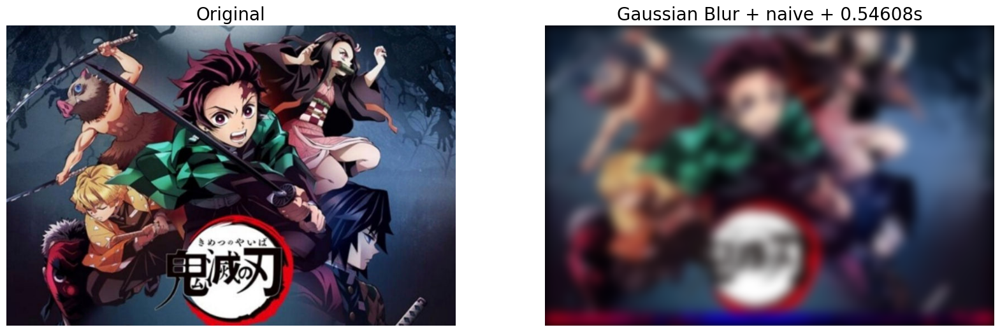

In [4]:
def NaiveGaussianBluring(gaussian_size,sigma):
    global img
    width, height = img.shape[0], img.shape[1]

    out = []
    for c in range(3):

        ch = main.Matrix(width,height)

        for w in range(width):
            for h in range(height):
                ch[w,h] = img[w,h,c]
        
        out.append(main.Gaussian(ch,gaussian_size,sigma))
        
    %pylab inline
    start = time.time()
    img2 = BluringResult(out)
    end = time.time()
    fig, (ax_original, ax_blurred) = pylab.subplots(1, 2, figsize=(20,8))
    ax_original.imshow(img)
    ax_original.set_title('Original', size=20)
    ax_original.set_axis_off()

    ax_blurred.imshow(img2)
    ax_blurred.set_title(f"Gaussian Blur + naive + {end-start:.5}s", size=20)
    ax_blurred.set_axis_off()
    fig.show()
    return end-start
gau_naive_cpp_time = NaiveGaussianBluring(gaussian_size = 50, sigma =10)
print("Gaussian Blurring + Naive + cpp : ",gau_naive_cpp_time)

### Mean filter blurring 

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_12333/3278672710.py:27: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Mean(box) Blurring + Naive + cpp :  0.6933588981628418


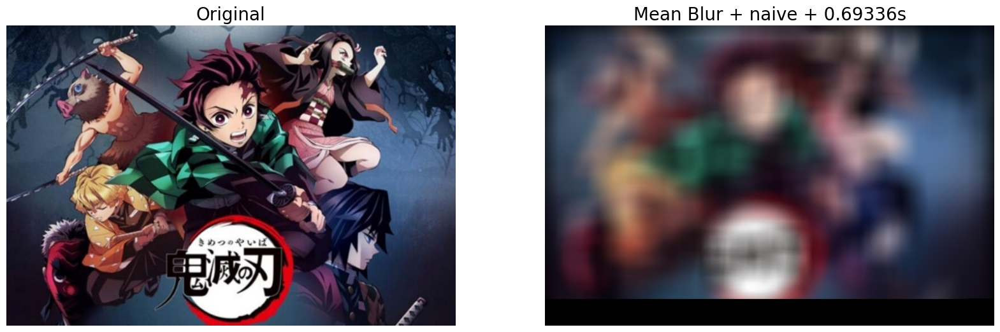

In [13]:
def BoxBluring(gaussian_size):
    global img
    width, height = img.shape[0], img.shape[1]

    out = []
    for c in range(3):
        ch = main.Matrix(width,height)

        for w in range(width):
            for h in range(height):
                ch[w,h] = img[w,h,c]
        
        out.append(main.BoxBlur(ch,gaussian_size))
        
    %pylab inline
    start = time.time()
    img2 = BluringResult(out)
    end = time.time()
    fig, (ax_original, ax_blurred) = pylab.subplots(1, 2, figsize=(20,8))
    ax_original.imshow(img)
    ax_original.set_title('Original', size=20)
    ax_original.set_axis_off()

    ax_blurred.imshow(img2)
    ax_blurred.set_title(f"Mean Blur + naive + {end-start:.5}s", size=20)
    ax_blurred.set_axis_off()
    fig.show()


    
    return end-start
box_naive_cpp_time = BoxBluring(gaussian_size = 50)
print("Mean(box) Blurring + Naive + cpp : ",box_naive_cpp_time)

## Naive In Python

### Gaussian Blurring

In [14]:
def convolute(kernel,title):
  
    start = time.time()
    img3 = signal.convolve(img, kernel[:, :, np.newaxis], mode='same').astype('int32')
    end = time.time()
    
    fig, (ax_original, ax_blurred) = pylab.subplots(1, 2, figsize=(20,8)) 
    ax_original.imshow(img)
    ax_original.set_title('Original', size=20)
    ax_original.set_axis_off()

    ax_blurred.imshow(img3)
    ax_blurred.set_title(title, size=20)
    ax_blurred.set_axis_off()
    fig.show()
    return end-start


/tmp/ipykernel_12333/1933852502.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


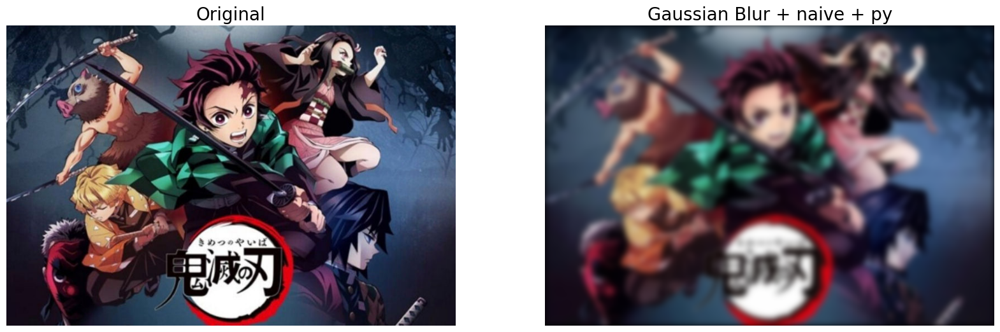

In [15]:
gau_naive_py_time = convolute(gaussian_kernel,title=f"Gaussian Blur + naive + py")

/tmp/ipykernel_12333/1933852502.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


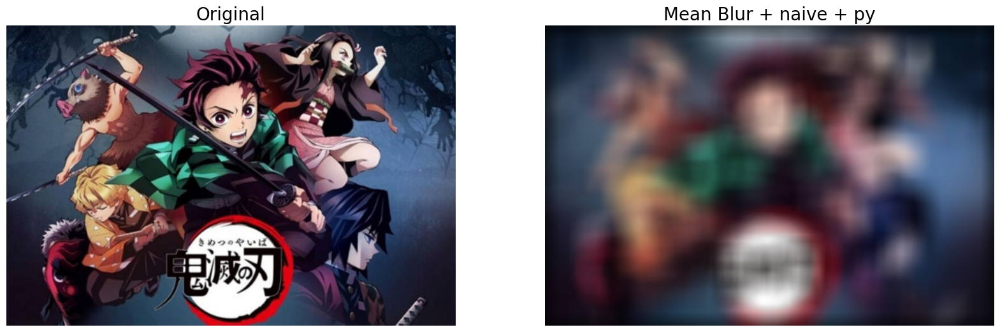

In [16]:
gau_naive_py_time = convolute(mean_kernel,title=f"Mean Blur + naive + py")

## fft

In [17]:
def fft(kernel,title):
    global img
    width, height = img.shape[0], img.shape[1]
    start = time.time()
    img3 = signal.fftconvolve(img, kernel[:, :, np.newaxis], mode='same').astype('int32')
    end = time.time()
    fig, (ax_original, ax_blurred) = pylab.subplots(1, 2, figsize=(20,8))
    ax_original.imshow(img)
    ax_original.set_title('Original', size=20)
    ax_original.set_axis_off()

    ax_blurred.imshow(img3)
    ax_blurred.set_title(title, size=20)
    ax_blurred.set_axis_off()
    fig.show()
    return end-start


### Gaussian

/tmp/ipykernel_12333/2243432279.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


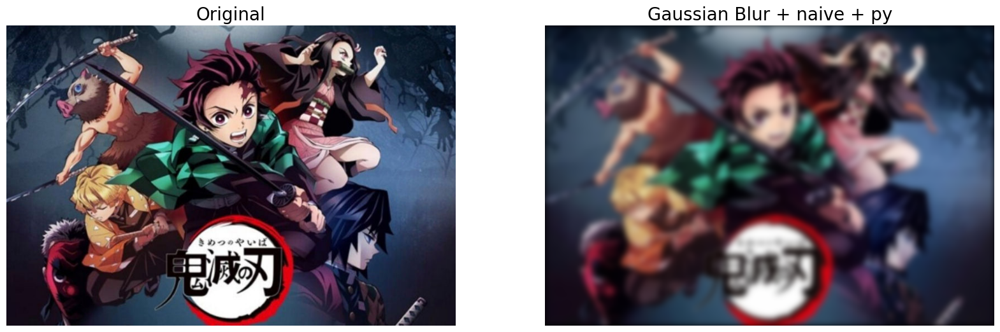

In [19]:
gau_fft_py_time = fft(gaussian_kernel,title='Gaussian Blur + naive + py')

### Mean

/tmp/ipykernel_12333/2243432279.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


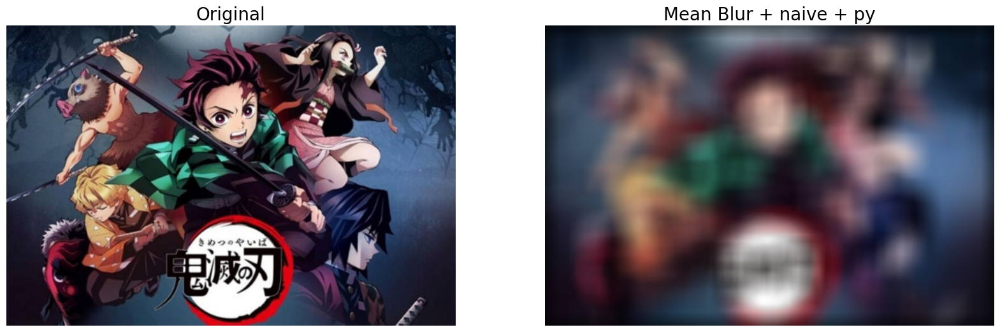

In [18]:
box_fft_py_time = fft(mean_kernel,title='Mean Blur + naive + py')

## Naive In Py

(543, 810, 3)


/tmp/ipykernel_12333/1703007948.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


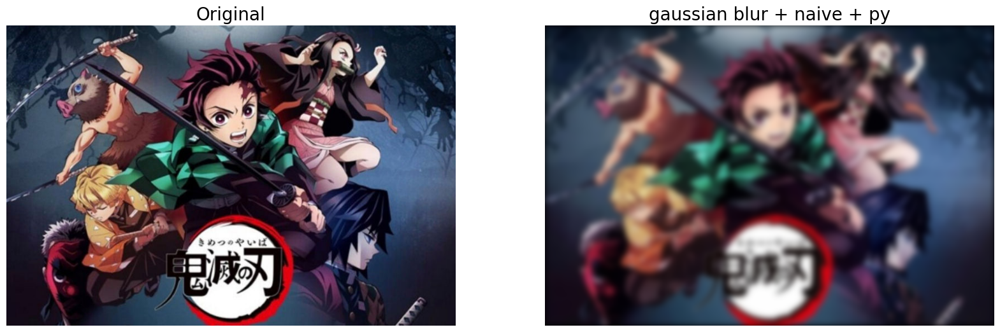

In [21]:
def convolute(kernel,title):
    # im = np.mean(imageio.imread('image.jpeg'), axis=2)
    width, height = img.shape[0], img.shape[1]

    start = time.time()
    img3 = signal.convolve(img, kernel[:, :, np.newaxis], mode='same').astype('int32')
    end = time.time()


    im = img
    print(im.shape)
    fig, (ax_original, ax_blurred) = pylab.subplots(1, 2, figsize=(20,8))
    ax_original.imshow(im)
    ax_original.set_title('Original', size=20)
    ax_original.set_axis_off()

    ax_blurred.imshow(img3)
    ax_blurred.set_title(title, size=20)
    ax_blurred.set_axis_off()
    fig.show()
    return end-start
gau_naive_py_time = convolute(gaussian_kernel,title='gaussian blur + naive + py')

(543, 810, 3)


/tmp/ipykernel_12333/1703007948.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


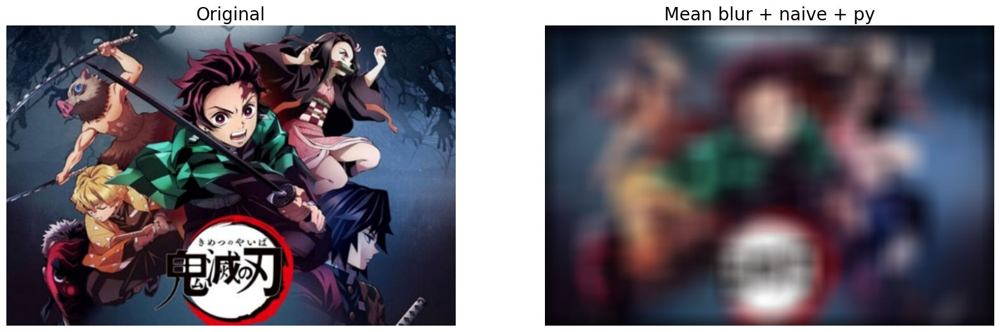

In [22]:
box_naive_py_time = convolute(mean_kernel,title='Mean blur + naive + py')

## Matrix multiplication

### gaussian

finish channel 0
finish channel 1
finish channel 2


/tmp/ipykernel_12333/872723556.py:69: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


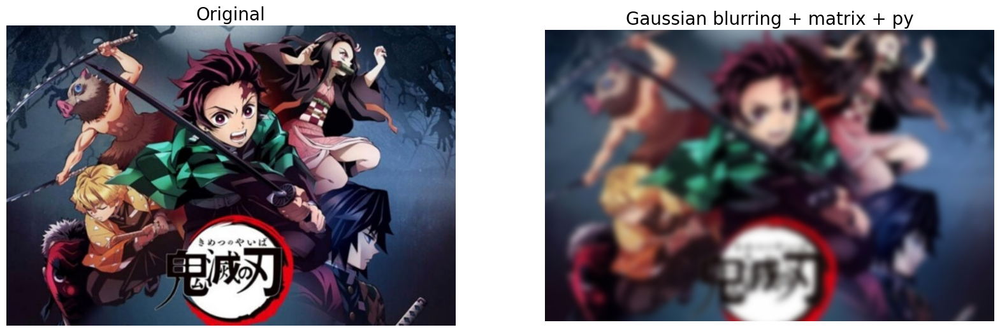

In [25]:
def convolution_matrix(kernel,title):
    
    out = []
    t = 0

    for c in range(3):
        
        kernel_size = kernel.shape[0]
        # Generate an image
        H = img.shape[0]
        W = img.shape[1]

        x = img[:,:,c].reshape(-1).reshape(H,W)

        stride = 1
        HH = kernel_size
        WW = kernel_size

        # Perform an im2col operation on x
        OH = H - HH + 1  # output height
        OW = W - WW + 1  # output width
        shape = (OH, OW, HH, WW)  # define the shape of output matrix
        strides = (x.strides[0],x.strides[1],x.strides[0],x.strides[1])   # define the strides(offset) according to shape
        # strides = x.itemsize * np.array(strides)  # turn unit of the strides into byte
        x_stride = np.lib.stride_tricks.as_strided(x, shape=shape, strides=strides)

        x_stride = x_stride.reshape(-1, kernel_size * kernel_size)
        flat_k = kernel.reshape(-1, kernel_size * kernel_size)
        x_stride = x_stride.T

        mask = main.Matrix(flat_k.shape[0],flat_k.shape[1])
        # print(mask.nrow,mask.ncol)
        for i in range(mask.nrow):
            for j in range(mask.ncol):
                mask[i,j] = flat_k[i,j]
        x_stride_cpp = main.Matrix(x_stride.shape[0],x_stride.shape[1])
        # print(x_stride_cpp.nrow,x_stride_cpp.ncol)
        for i in range(x_stride.shape[0]):
            for j in range(x_stride.shape[1]):
                x_stride_cpp[i,j] = x_stride[i,j]

        
        
        start = time.time()
        o = main.multiply_mkl(mask,x_stride_cpp)
        t+=time.time()-start
        output = np.ones((o.nrow,o.ncol))
        for i in range(output.shape[0]):
            for j in range(output.shape[1]):  
                output[i,j] = o[i,j]

        # # output = flat_k @ x_stride
        output = output.reshape(-1).reshape(OH, OW)
        if c ==0:
            out = np.expand_dims(output,axis=2)
        else:
            out = np.append(out,np.expand_dims(output,axis=2),axis=2)
        print("finish channel",c)

    fig, (ax_original, ax_blurred) = pylab.subplots(1, 2, figsize=(20,8))
    ax_original.imshow(img)
    ax_original.set_title('Original', size=20)
    ax_original.set_axis_off()

    ax_blurred.imshow(out.astype(int))
    ax_blurred.set_title(title, size=20)
    ax_blurred.set_axis_off()
    
    fig.show()
    return t
gau_matrix_py_time = convolution_matrix(gaussian_kernel,title='Gaussian blurring + matrix + py')



finish channel 0
finish channel 1
finish channel 2


/tmp/ipykernel_12333/872723556.py:69: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


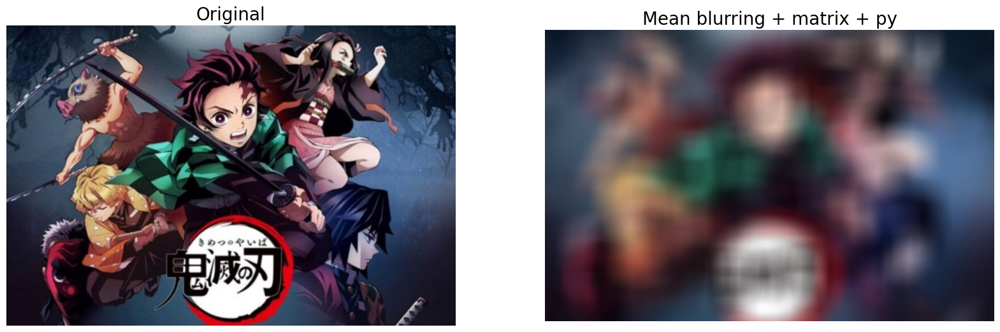

In [26]:
box_matrix_py_time = convolution_matrix(mean_kernel,title='Mean blurring + matrix + py')
